In [2]:
import gc
import os

import torch
import torch.nn.functional as F
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm.auto import tqdm
from PIL import Image, ImageDraw, ImageFont
from torchvision.datasets import CocoDetection
from sklearn.metrics import confusion_matrix, classification_report

from transformers import TrainingArguments, Trainer, DeformableDetrForObjectDetection, AutoImageProcessor

os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

## Dataset Loading

In [3]:
class SignDataset(CocoDetection):
    def __init__(self, img_folder, ann_file, processor):
        super().__init__(img_folder, ann_file)
        self.processor = processor
        cat_ids = self.coco.getCatIds()
        self.cat_to_idx = {cat_id: i for i, cat_id in enumerate(cat_ids)}

    def __getitem__(self, idx):
        img, target = super().__getitem__(idx)
        image_id = self.ids[idx]
        
        valid_annotations = []
        for ann in target:
            # 1. Remap IDs
            ann_copy = ann.copy()
            ann_copy['category_id'] = self.cat_to_idx[ann['category_id']]
            
            # 2. Sanity check: Ensure box has area and positive dimensions
            # COCO format is [x_min, y_min, width, height]
            if ann['bbox'][2] > 0 and ann['bbox'][3] > 0:
                valid_annotations.append(ann_copy)
        
        # If an image has NO valid boxes, DETR can fail. 
        # We ensure at least one "dummy" box or skip if necessary, 
        # but usually, valid_annotations is enough.
        
        target = {'image_id': image_id, 'annotations': valid_annotations}
        encoding = self.processor(images=img, annotations=target, return_tensors="pt")
        
        return {
            "pixel_values": encoding["pixel_values"].squeeze(0),
            "labels": encoding["labels"][0]
        }

# Initialize Processor
model_checkpoint = "Sensetime/deformable-detr"
processor = AutoImageProcessor.from_pretrained(model_checkpoint)

# Define Paths based on your screenshot
train_dataset = SignDataset(
    img_folder="C:/Users/matth/Desktop/CV_Assignment/COCO-based_COCO_condition/images/train",
    ann_file="C:/Users/matth/Desktop/CV_Assignment/COCO-based_COCO_condition/annotations/train.json",
    processor=processor
)
val_dataset = SignDataset(
    img_folder="C:/Users/matth/Desktop/CV_Assignment/COCO-based_COCO_condition/images/val",
    ann_file="C:/Users/matth/Desktop/CV_Assignment/COCO-based_COCO_condition/annotations/val.json",
    processor=processor
)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


## Model Initialization

In [4]:
# 1. Initialize Processor (this defines 'processor')
model_checkpoint = "Sensetime/deformable-detr"
processor = AutoImageProcessor.from_pretrained(
    model_checkpoint,
    size={"shortest_edge": 480, "longest_edge": 640} # Reduced size for 8GB VRAM
)

# 2. Re-initialize Model with your specific classes
# Make sure num_labels matches your highest category ID + 1
id2label = {0: "Good", 1: "Heavily Damaged", 2: "Weathered"}
label2id = {v: k for k, v in id2label.items()}

model = DeformableDetrForObjectDetection.from_pretrained(
    model_checkpoint,
    num_labels=len(id2label),
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)

# 3. Freeze Backbone for memory efficiency
for param in model.model.backbone.parameters():
    param.requires_grad = False

c:\Users\matth\miniconda3\envs\ARI3129\lib\site-packages\torch\nn\modules\module.py:2400: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
c:\Users\matth\miniconda3\envs\ARI3129\lib\site-packages\torch\nn\modules\module.py:2400: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
c:\Users\matth\miniconda3\envs\ARI3129\lib\site-packages\torch\nn\modules\module.py:2400: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the cu

In [5]:
def collate_fn(batch):
    pixel_values = [item["pixel_values"] for item in batch]
    encoding = processor.pad(pixel_values, return_tensors="pt")
    labels = [item["labels"] for item in batch]
    batch = {}
    batch["pixel_values"] = encoding["pixel_values"]
    batch["pixel_mask"] = encoding["pixel_mask"]
    batch["labels"] = labels
    return batch

def clear_gpu():
    gc.collect()
    torch.cuda.empty_cache()
    if torch.cuda.is_available():
        torch.cuda.ipc_collect()

clear_gpu()

## Training Setup

In [5]:

# 1. Smaller Image Size (Massive VRAM saver)
processor = AutoImageProcessor.from_pretrained(
    model_checkpoint,
    size={"shortest_edge": 480, "longest_edge": 640} 
)

# 2. Re-initialize Model
model = DeformableDetrForObjectDetection.from_pretrained(
    model_checkpoint,
    num_labels=len(id2label),
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)

# 3. Freeze the Backbone (Cuts memory significantly)
# We only train the transformer layers and the detection head
for param in model.model.backbone.parameters():
    param.requires_grad = False

training_args = TrainingArguments(
    output_dir="deformable-detr-sign-condition_2",
    per_device_train_batch_size=1,
    per_device_eval_batch_size=1,      # CRUCIAL: Prevent OOM during validation
    gradient_accumulation_steps=8,
    eval_accumulation_steps=4,         # Offloads evaluation tensors to CPU periodically
    gradient_checkpointing=True,
    fp16=True,
    learning_rate=1e-4,
    num_train_epochs=25,
    remove_unused_columns=False,
    optim="adamw_torch",
    full_determinism=False,            # Avoids the cumsum error

    # Logging & Validation
    eval_strategy="epoch",              # Only evaluate at the end of each epoch
    logging_strategy="epoch",           # Only log once per epoch for a clean table
    save_strategy="epoch",     
    load_best_model_at_end=True,      
    metric_for_best_model="loss",             # Set to 0 on Windows to avoid multi-process overhead
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    data_collator=collate_fn
)

# Clear one last time before starting
clear_gpu()

trainer.train()

Some weights of the model checkpoint at Sensetime/deformable-detr were not used when initializing DeformableDetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DeformableDetrForObjectDetection wer

Epoch,Training Loss,Validation Loss
1,40.784900,4.170778
2,1.927800,1.334031
3,1.150500,1.018278
4,0.972200,0.966765
5,0.928100,0.953799
6,0.829400,0.876681
7,0.751500,0.794224
8,0.702500,0.813701
9,0.668100,0.766455
10,0.634700,0.741099


There were missing keys in the checkpoint model loaded: ['class_embed.1.weight', 'class_embed.1.bias', 'class_embed.2.weight', 'class_embed.2.bias', 'class_embed.3.weight', 'class_embed.3.bias', 'class_embed.4.weight', 'class_embed.4.bias', 'class_embed.5.weight', 'class_embed.5.bias', 'bbox_embed.1.layers.0.weight', 'bbox_embed.1.layers.0.bias', 'bbox_embed.1.layers.1.weight', 'bbox_embed.1.layers.1.bias', 'bbox_embed.1.layers.2.weight', 'bbox_embed.1.layers.2.bias', 'bbox_embed.2.layers.0.weight', 'bbox_embed.2.layers.0.bias', 'bbox_embed.2.layers.1.weight', 'bbox_embed.2.layers.1.bias', 'bbox_embed.2.layers.2.weight', 'bbox_embed.2.layers.2.bias', 'bbox_embed.3.layers.0.weight', 'bbox_embed.3.layers.0.bias', 'bbox_embed.3.layers.1.weight', 'bbox_embed.3.layers.1.bias', 'bbox_embed.3.layers.2.weight', 'bbox_embed.3.layers.2.bias', 'bbox_embed.4.layers.0.weight', 'bbox_embed.4.layers.0.bias', 'bbox_embed.4.layers.1.weight', 'bbox_embed.4.layers.1.bias', 'bbox_embed.4.layers.2.weight',

TrainOutput(global_step=1900, training_loss=2.260647326017681, metrics={'train_runtime': 9592.3877, 'train_samples_per_second': 1.574, 'train_steps_per_second': 0.198, 'total_flos': 9.58536753706266e+18, 'train_loss': 2.260647326017681, 'epoch': 25.0})

In [6]:
# 1. Get the category names from the training dataset
cat_ids = train_dataset.coco.getCatIds()
categories = train_dataset.coco.loadCats(cat_ids)

# 2. Create the 0-indexed mapping exactly like the dataset class does
id2label = {i: cat['name'] for i, cat in enumerate(categories)}

print(id2label)
print(label2id)
# 3. Update your model config with this new mapping
model.config.id2label = id2label
model.config.label2id = label2id

print("Corrected Mapping:", model.config.id2label)

{0: 'Good', 1: 'Heavily Damaged', 2: 'Weathered'}
{'Good': 0, 'Heavily Damaged': 1, 'Weathered': 2}
Corrected Mapping: {0: 'Good', 1: 'Heavily Damaged', 2: 'Weathered'}


In [7]:

# Use the actual folder name found in your directory
model_path = "deformable-detr-sign-condition/checkpoint-700" 

model = DeformableDetrForObjectDetection.from_pretrained(
    model_path,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)
# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

c:\Users\matth\miniconda3\envs\ARI3129\lib\site-packages\torch\nn\modules\module.py:1326: UserWarning: expandable_segments not supported on this platform (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\c10/cuda/CUDAAllocatorConfig.h:28.)
  return t.to(


DeformableDetrForObjectDetection(
  (model): DeformableDetrModel(
    (backbone): DeformableDetrConvModel(
      (conv_encoder): DeformableDetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DeformableDetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DeformableDetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DeformableDetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3):

In [8]:
def run_inference(image_path, confidence_threshold=0.4):
    # Load and process image
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(model.device)
    
    # Forward pass
    model.eval()
    with torch.no_grad():
        outputs = model(**inputs)
    
    # Post-process results
    # Convert outputs (logits and boxes) to Pascal VOC format (xmin, ymin, xmax, ymax)
    target_sizes = torch.tensor([image.size[::-1]]).to(model.device)
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=confidence_threshold)[0]
    
    return image, results

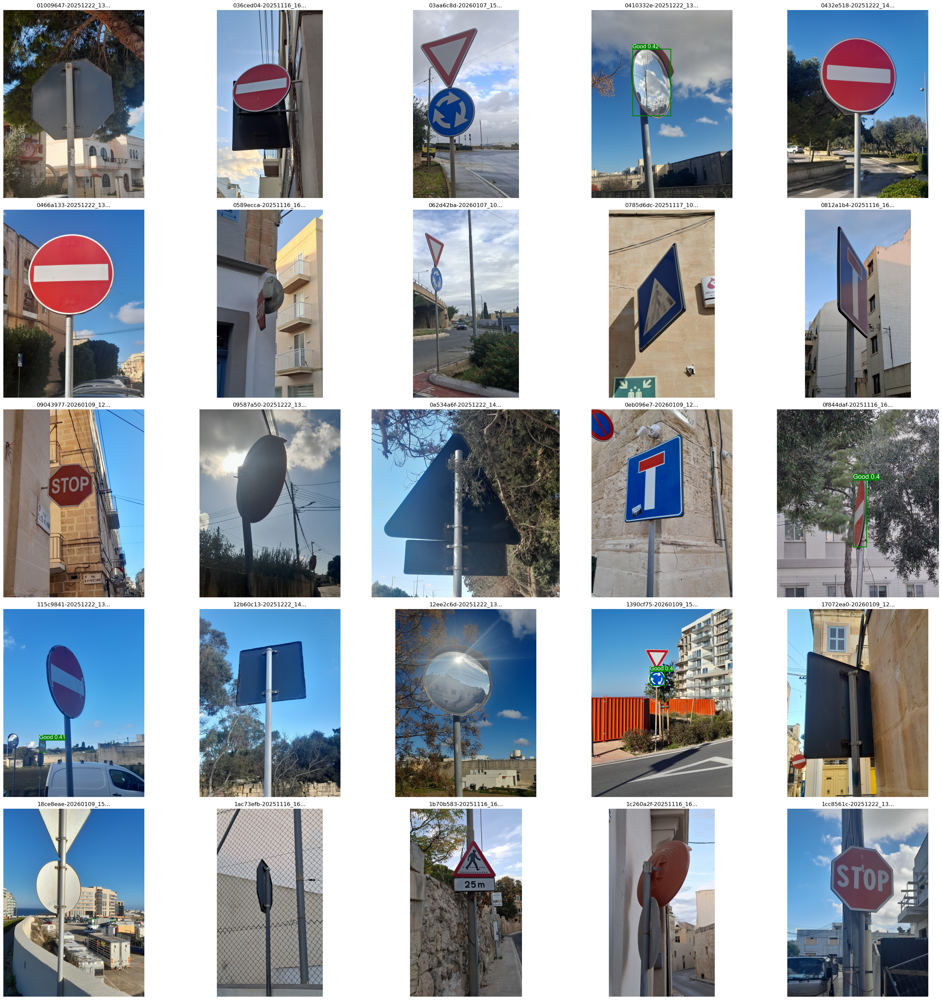

In [9]:
colors = {"Good": "green", "Weathered": "orange", "Very Damaged": "red"}

# 1. Select up to 25 images for the grid
test_img_dir = os.path.join("C:/Users/matth/Desktop/CV_Assignment/COCO-based_COCO_condition/images/train")
test_images = [f for f in os.listdir(test_img_dir) if f.endswith(('.jpg', '.png'))][:25]

# 2. Setup the 5x5 grid
fig, axes = plt.subplots(5, 5, figsize=(30, 30))
axes = axes.flatten()

for i, img_name in enumerate(test_images):
    img_path = os.path.join(test_img_dir, img_name)
    image, results = run_inference(img_path)
    width, height = image.size
    dynamic_font_size = max(14, int(width * 0.04)) 
    dynamic_stroke_width = max(2, int(width * 0.006))
    
    try:
        font = ImageFont.truetype("arial.ttf", dynamic_font_size)
    except:
        font = ImageFont.load_default()
        
    draw = ImageDraw.Draw(image)
    
    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        box = [round(i, 2) for i in box.tolist()]
        
        label_id = label.item()
        label_name = model.config.id2label.get(label_id, f"ID:{label_id}")
        # 3. Apply the logic: get color from our dict, default to red if not found
        color = colors.get(label_name, "red") 
        
        draw.rectangle(box, outline=color, width=dynamic_stroke_width)
        
        text = f"{label_name} {round(score.item(), 2)}"
        text_bbox = draw.textbbox((box[0], box[1]), text, font=font)
        
        # Draw background bar for text using the same logic color
        text_rect = [text_bbox[0], text_bbox[1] - dynamic_font_size, text_bbox[2], text_bbox[1]]
        draw.rectangle(text_rect, fill=color)
        draw.text((box[0], box[1] - dynamic_font_size), text, fill="white", font=font)

    axes[i].imshow(image)
    axes[i].set_title(img_name[:20] + "...", fontsize=12)
    axes[i].axis("off")

for j in range(i + 1, 25):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

In [10]:
# Initialize test dataset
test_dataset = SignDataset(
    img_folder=os.path.join("C:/Users/matth/Desktop/CV_Assignment/COCO-based_COCO_condition/images/test"),
    ann_file=os.path.join("C:/Users/matth/Desktop/CV_Assignment/COCO-based_COCO_condition/annotations/test.json"),
    processor=processor
)

# Run evaluation
test_results = trainer.predict(test_dataset)
print(f"Test Loss: {test_results.metrics['test_loss']}")

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


NameError: name 'trainer' is not defined

In [11]:
def debug_prediction_logits(image_path):
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(model.device)
    
    model.eval()
    with torch.no_grad():
        outputs = model(**inputs)
    
    print( image)
    # Deformable DETR outputs logits of shape [batch, num_queries, num_classes]
    # We look at the top 5 queries with the highest non-background probability
    logits = outputs.logits[0] # [num_queries, num_classes]
    probs = F.softmax(logits, dim=-1)
    
    # The last class is usually the "no object" background class
    # We want to see the max probability for the ACTUAL sign classes
    print(logits,probs)
    sign_probs = probs[:, :-1] 
    top_values, top_indices = torch.topk(sign_probs.max(dim=-1).values, 5)

    print(f"--- Debugging: {os.path.basename(image_path)} ---")
    for i in range(5):
        query_idx = top_indices[i]
        best_class_idx = torch.argmax(sign_probs[query_idx]).item()
        confidence = sign_probs[query_idx][best_class_idx].item()
        label = model.config.id2label[best_class_idx]
        
        print(f"Query {query_idx}: Predicted '{label}' with {confidence:.4f} confidence")

# Run it on your specific test image
debug_prediction_logits(os.path.join(test_img_dir, "036ced04-20251116_163436.jpg"))

<PIL.Image.Image image mode=RGB size=2296x4080 at 0x229529B9750>
tensor([[-3.0881, -3.4813, -3.3989],
        [-2.8744, -3.2663, -3.1856],
        [-2.9291, -3.3717, -3.2822],
        [-3.1544, -3.5027, -3.4270],
        [-2.9774, -3.3971, -3.3106],
        [-3.1116, -3.4835, -3.4030],
        [-2.8896, -3.2763, -3.1990],
        [-3.0260, -3.4320, -3.3455],
        [-2.9403, -3.3504, -3.2659],
        [-3.0580, -3.4234, -3.3475],
        [-2.5402, -3.0364, -2.9382],
        [-2.9494, -3.3075, -3.2366],
        [-2.6872, -3.1716, -3.0735],
        [-3.0331, -3.4470, -3.3621],
        [-3.1341, -3.4908, -3.4145],
        [-3.1346, -3.5094, -3.4279],
        [-3.0683, -3.4631, -3.3807],
        [-3.1328, -3.4973, -3.4185],
        [-3.1128, -3.4880, -3.4086],
        [-3.0045, -3.3325, -3.2602],
        [-3.0746, -3.4536, -3.3754],
        [-3.0242, -3.4290, -3.3440],
        [-3.0163, -3.4033, -3.3203],
        [-3.0352, -3.4594, -3.3729],
        [-3.1459, -3.5162, -3.4363],
        [-

100%|██████████| 133/133 [00:25<00:00,  5.15it/s]


                 precision    recall  f1-score   support

           Good       0.68      0.53      0.60       159
Heavily Damaged       0.00      0.00      0.00         5
      Weathered       0.00      0.00      0.00        21
     Background       0.00      0.00      0.00        30

       accuracy                           0.39       215
      macro avg       0.17      0.13      0.15       215
   weighted avg       0.51      0.39      0.44       215



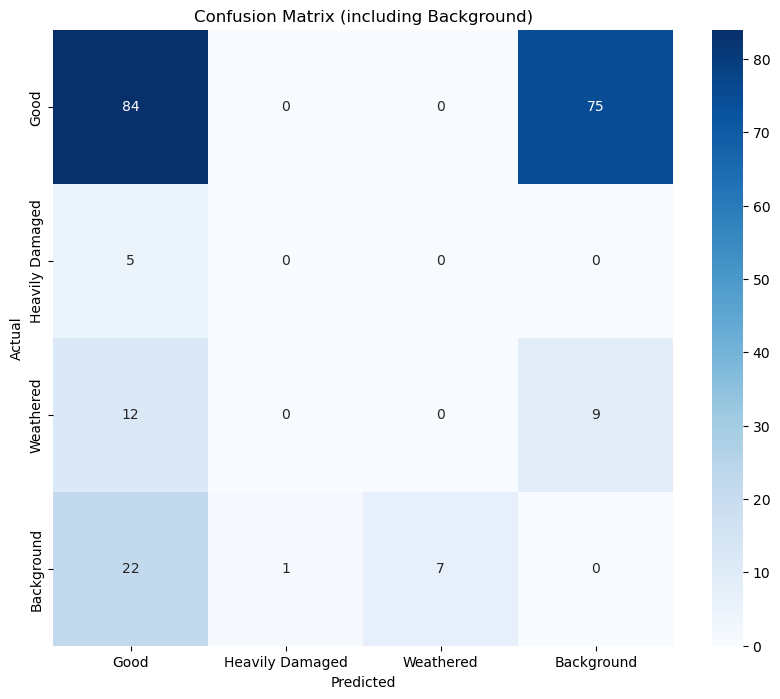

In [14]:


def box_iou(box1, box2):
    # Standard IoU calculation
    x1, y1, x2, y2 = box1
    x1g, y1g, x2g, y2g = box2
    
    xi1 = max(x1, x1g)
    yi1 = max(y1, y1g)
    xi2 = min(x2, x2g)
    yi2 = min(y2, y2g)
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    
    box1_area = (x2 - x1) * (y2 - y1)
    box2_area = (x2g - x1g) * (y2g - y1g)
    union_area = box1_area + box2_area - inter_area
    
    return inter_area / union_area if union_area > 0 else 0

def get_metrics(model, processor, dataset, id2label, threshold=0.3, iou_threshold=0.5):
    model.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    all_gt_labels = []
    all_pred_labels = []
    
    # We add a "Background" class for False Positives and False Negatives
    classes = list(id2label.values())
    bg_idx = len(classes)
    class_names_with_bg = classes + ["Background"]

    for i in tqdm(range(len(dataset))):
        # 1. Get the Image ID and the actual Image object
        # In custom SignDataset, targets are usually at dataset.predictions or indexed by coco
        img_id = dataset.ids[i]
        img_info = dataset.coco.loadImgs(img_id)[0]
        
        # Load the raw image
        img_path = os.path.join(dataset.root, img_info['file_name'])
        img = Image.open(img_path).convert("RGB")
        width, height = img.size
        
        # 2. Get the Ground Truth (GT) annotations for this image
        ann_ids = dataset.coco.getAnnIds(imgIds=img_id)
        target_anns = dataset.coco.loadAnns(ann_ids)
        
        # 3. Get Model Predictions
        inputs = processor(images=img, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model(**inputs)
        
        # Post-process to get boxes in pixel coordinates
        results = processor.post_process_object_detection(
            outputs, 
            target_sizes=[(height, width)], 
            threshold=threshold
        )[0]
        
        preds = []
        for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
            preds.append({'box': box.tolist(), 'label': label.item(), 'score': score.item()})
            
        gts = []
        for ann in target_anns:
            # Convert COCO [x, y, w, h] to [x1, y1, x2, y2]
            x, y, w, h = ann['bbox']
            # Map category_id to the 0-indexed labels used by the model
            label = dataset.cat_to_idx.get(ann['category_id'], ann['category_id'])
            gts.append({'box': [x, y, x + w, y + h], 'label': label})

        # 3. Match Preds to GTs based on IoU
        matched_gt = set()
        for p in preds:
            best_iou = 0
            best_gt_idx = -1
            
            for idx, g in enumerate(gts):
                if idx in matched_gt: continue
                iou = box_iou(p['box'], g['box'])
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx
            
            if best_iou >= iou_threshold:
                # True Positive or Misclassification
                all_gt_labels.append(gts[best_gt_idx]['label'])
                all_pred_labels.append(p['label'])
                matched_gt.add(best_gt_idx)
            else:
                # False Positive (Predicted something that isn't there)
                all_gt_labels.append(bg_idx) # Background
                all_pred_labels.append(p['label'])
        
        # 4. Handle False Negatives (GTs that were never predicted)
        for idx, g in enumerate(gts):
            if idx not in matched_gt:
                all_gt_labels.append(g['label'])
                all_pred_labels.append(bg_idx) # Background

    # Generate Metrics
    cm = confusion_matrix(all_gt_labels, all_pred_labels)
    report = classification_report(all_gt_labels, all_pred_labels, target_names=class_names_with_bg)
    
    return cm, report, class_names_with_bg

# Run Evaluation
cm, report, names = get_metrics(model, processor, val_dataset, id2label)
print(report)

# Plot Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=names, yticklabels=names, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (including Background)')
plt.show()

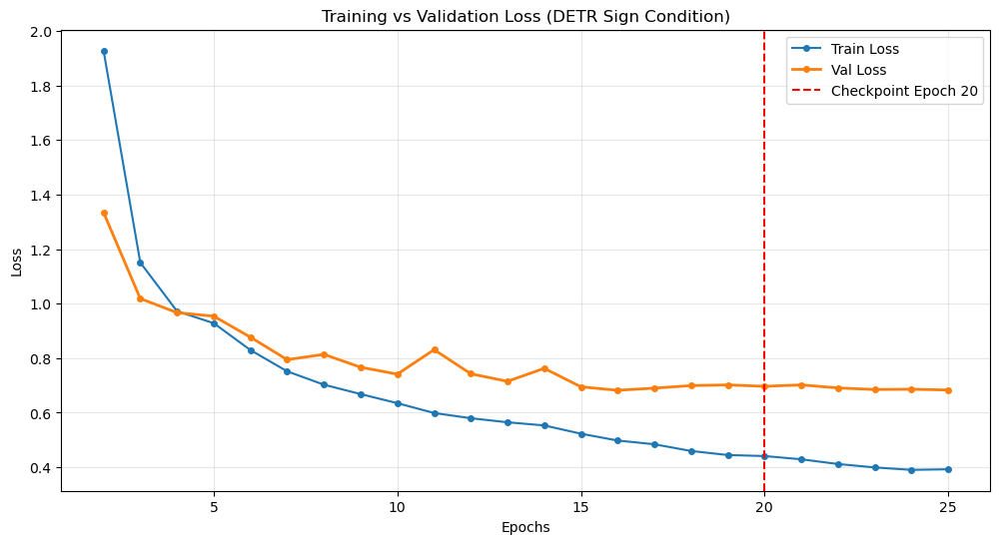

In [16]:
import matplotlib.pyplot as plt

log_data = """
Epoch    Training Loss    Validation Loss
1    40.784900    4.170778
2    1.927800    1.334031
3    1.150500    1.018278
4    0.972200    0.966765
5    0.928100    0.953799
6    0.829400    0.876681
7    0.751500    0.794224
8    0.702500    0.813701
9    0.668100    0.766455
10    0.634700    0.741099
11    0.598700    0.830834
12    0.579500    0.742505
13    0.564600    0.714735
14    0.553100    0.762418
15    0.522700    0.694614
16    0.497700    0.681902
17    0.484000    0.689847
18    0.459300    0.699184
19    0.444500    0.701655
20    0.440700    0.696426
21    0.428900    0.701723
22    0.411500    0.690629
23    0.399000    0.684792
24    0.390100    0.685807
25    0.392200    0.682983
"""

# Extract data
train_loss = []
val_loss = []
epochs = []

# Split by lines and skip the header
lines = log_data.strip().split('\n')
for line in lines[1:]:  # [1:] skips the "Epoch Training Loss..." header
    parts = line.split() # Splits by any whitespace
    if len(parts) == 3:
        epochs.append(int(parts[0]))
        train_loss.append(float(parts[1]))
        val_loss.append(float(parts[2]))

# Plot
plt.figure(figsize=(12, 6))

# Slicing [1:] or [2:] is good practice to skip the massive spike at Epoch 1 
# so you can actually see the detail of the later epochs.
plt.plot(epochs[1:], train_loss[1:], label='Train Loss', marker='o', markersize=4) 
plt.plot(epochs[1:], val_loss[1:], label='Val Loss', linewidth=2, marker='o', markersize=4)

# Your data shows the lowest Validation Loss is actually around Epoch 16 (0.6819)
# but I will keep your red line at 20 as requested.
plt.axvline(x=20, color='r', linestyle='--', label='Checkpoint Epoch 20')

plt.title("Training vs Validation Loss (DETR Sign Condition)")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [28]:
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

def get_comparison_counts(dataset, model, processor, threshold=0.1): # Lowered threshold to see early progress
    model.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    categories = list(model.config.id2label.values())
    gt_counts = {cat: 0 for cat in categories}
    pred_counts = {cat: 0 for cat in categories}

    for idx in tqdm(range(len(dataset)), desc="Comparing GT vs Preds"):
        item = dataset[idx]
        pixel_values = item["pixel_values"].unsqueeze(0).to(device)
        
        # 1. Count Ground Truths
        for label_id in item["labels"]["class_labels"]:
            label_name = model.config.id2label.get(label_id.item(), "Unknown")
            if label_name in gt_counts:
                gt_counts[label_name] += 1

        # 2. Count Predictions
        with torch.no_grad():
            outputs = model(pixel_values=pixel_values)
        
        # FIX: Get ORIGINAL image sizes from COCO metadata
        img_info = dataset.coco.loadImgs(dataset.ids[idx])[0]
        orig_target_sizes = torch.tensor([[img_info["height"], img_info["width"]]]).to(device)
        
        # Post-process with the correct original sizes
        results = processor.post_process_object_detection(
            outputs, 
            target_sizes=orig_target_sizes, 
            threshold=threshold
        )[0]
        
        for label_id in results["labels"]:
            label_name = model.config.id2label.get(label_id.item(), "Unknown")
            if label_name in pred_counts:
                pred_counts[label_name] += 1
                
    return gt_counts, pred_counts

# Run the counter
gt_counts, pred_counts = get_comparison_counts(test_dataset, model, processor)

Comparing GT vs Preds: 100%|██████████| 138/138 [00:25<00:00,  5.41it/s]


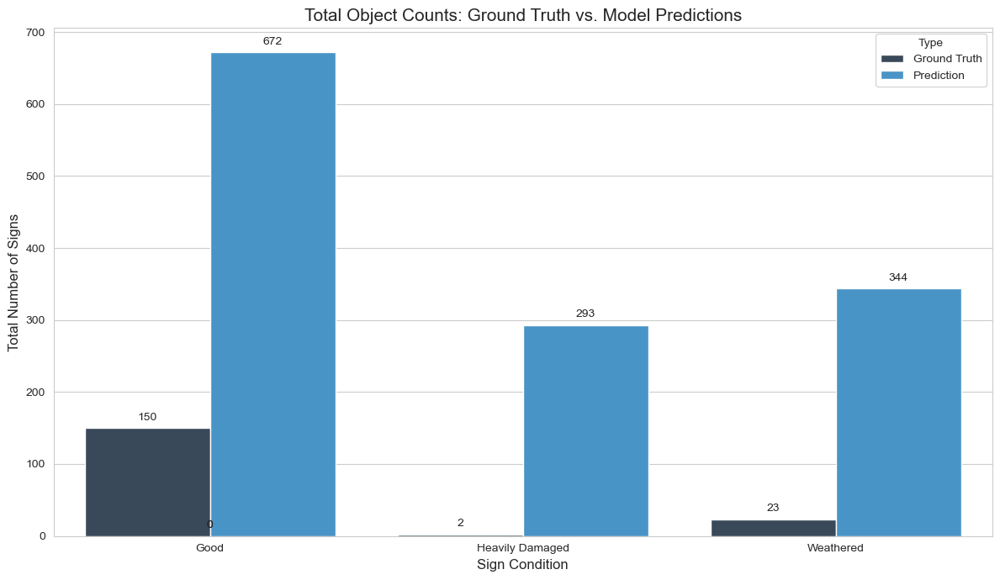

In [29]:
def plot_gt_vs_preds(gt_counts, pred_counts):
    # Convert to DataFrame for easier plotting
    data = []
    for cat in gt_counts.keys():
        data.append({"Category": cat, "Count": gt_counts[cat], "Type": "Ground Truth"})
        data.append({"Category": cat, "Count": pred_counts[cat], "Type": "Prediction"})
    
    df = pd.DataFrame(data)

    plt.figure(figsize=(12, 7))
    sns.set_style("whitegrid")
    
    # Create grouped bar chart
    ax = sns.barplot(data=df, x="Category", y="Count", hue="Type", palette=["#34495e", "#3498db"])
    
    # Add labels and styling
    plt.title("Total Object Counts: Ground Truth vs. Model Predictions", fontsize=15)
    plt.xlabel("Sign Condition", fontsize=12)
    plt.ylabel("Total Number of Signs", fontsize=12)
    
    # Add numerical labels on top of bars
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'center', 
                    xytext = (0, 9), 
                    textcoords = 'offset points')

    plt.tight_layout()
    plt.show()

plot_gt_vs_preds(gt_counts, pred_counts)

In [27]:
import time
import torch
import numpy as np
import torchvision.ops as ops
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from tqdm import tqdm

def get_comprehensive_report(dataset, model, processor, threshold=0.1):
    model.eval()
    device = next(model.parameters()).device
    
    # Enable extended_summary to get precision/recall curves
    metric = MeanAveragePrecision(box_format="xyxy", class_metrics=True, extended_summary=True)
    inference_times = []

    for idx in tqdm(range(len(dataset))):
        item = dataset[idx]
        pixel_values = item["pixel_values"].unsqueeze(0).to(device)
        
        t0 = time.perf_counter()
        with torch.no_grad():
            outputs = model(pixel_values=pixel_values)
        inference_times.append((time.perf_counter() - t0) * 1000)
        
        img_info = dataset.coco.loadImgs(dataset.ids[idx])[0]
        h, w = img_info["height"], img_info["width"]
        target_sizes = torch.tensor([[h, w]]).to(device)
        
        results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=threshold)[0]
        
        # Ground Truth Scaling
        gt_boxes = item["labels"]["boxes"].cpu()
        import torchvision.ops as ops
        gt_boxes_unnorm = ops.box_convert(gt_boxes, 'cxcywh', 'xyxy')
        gt_boxes_unnorm *= torch.tensor([w, h, w, h]) 
        
        targets = [{"boxes": gt_boxes_unnorm, "labels": item["labels"]["class_labels"].cpu()}]
        preds = [{"boxes": results["boxes"].cpu(), "scores": results["scores"].cpu(), "labels": results["labels"].cpu()}]
        
        metric.update(preds, targets)

    results = metric.compute()

    # --- UPDATED METRIC EXTRACTION ---
    # map_50 and map (50-95) are standard
    mAP50 = results['map_50'].item()
    mAP50_95 = results['map'].item()
    
    # In extended_summary, 'precision' is a 5D tensor: [T, R, K, A, M]
    # T: thresholds, R: recall levels, K: categories, A: areas, M: max detections
    # To get a single "Precision" value, we typically look at mAP@50 (T=0)
    precision_values = results['precision'] 
    recall_values = results['recall']
    
    # We take the mean across categories for a global value
    # Filter out -1 (which torchmetrics uses for empty classes)
    p = precision_values[precision_values > 0].mean().item() if (precision_values > 0).any() else 0
    r = recall_values[recall_values > 0].mean().item() if (recall_values > 0).any() else 0
    f1 = 2 * (p * r) / (p + r) if (p + r) > 0 else 0

    print("\n" + "="*40)
    print(f"mAP@50:         {mAP50:.4f}")
    print(f"mAP@50-95:      {mAP50_95:.4f}")
    print(f"Precision:      {p:.4f}")
    print(f"Recall:         {r:.4f}")
    print(f"F1-Score:       {f1:.4f}")
    print(f"Inference:      {np.mean(inference_times):.2f} ms")
    print("="*40)
    
    return results

# Run the final evaluation
test_metrics = get_comprehensive_report(test_dataset, model, processor)


100%|██████████| 138/138 [00:24<00:00,  5.56it/s]



mAP@50:         0.2474
mAP@50-95:      0.1179
Precision:      0.2814
Recall:         0.5043
F1-Score:       0.3612
Inference:      40.63 ms
